# Predicting Stock Prices with Linear Regression

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

plt.style.use('seaborn-darkgrid')
plt.rc('figure', figsize=(16,10))
plt.rc('lines', markersize=4)

In [2]:
data = pd.read_csv('BSE_30.csv')
data.head()

,Symbol,Date,Open,High,Low,Close,Adj Close,Volume
0,ADANIPORTS,5/6/2008,150.000000,153.570007,147.820007,151.149994,134.313477,1782030.0
1,ADANIPORTS,5/7/2008,152.000000,154.460007,150.240005,153.309998,136.232864,1180015.0
2,ADANIPORTS,5/8/2008,152.199997,156.759995,150.199997,155.889999,138.525497,1856245.0
3,ADANIPORTS,5/9/2008,155.000000,160.600006,154.210007,156.520004,139.085312,3251375.0
4,ADANIPORTS,5/12/2008,156.000000,163.479996,151.000000,162.500000,144.399170,5031635.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73316 entries, 0 to 73315
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Symbol     73316 non-null  object 
 1   Date       73316 non-null  object 
 2   Open       73066 non-null  float64
 3   High       73066 non-null  float64
 4   Low        73066 non-null  float64
 5   Close      73066 non-null  float64
 6   Adj Close  73066 non-null  float64
 7   Volume     73066 non-null  float64
dtypes: float64(6), object(2)
memory usage: 4.5+ MB


In [4]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,7.306600e+04,73066.000000,73066.000000,73066.000000,73066.000000,7.306600e+04
mean,1.062480e+03,727.110561,691.747601,700.079220,654.261675,9.492631e+05
std,6.622460e+04,3628.468133,889.374881,897.655362,880.902618,5.895543e+06
min,8.490000e+00,8.490000,8.160000,8.290000,5.509582,0.000000e+00
25%,2.113330e+02,214.100006,208.100006,210.875000,179.850136,8.899050e+04
50%,3.660000e+02,371.200012,360.338013,365.625000,337.238724,2.750420e+05
75%,8.098890e+02,818.574982,799.000000,808.295990,756.799606,8.296710e+05
max,1.686780e+07,910953.000000,9711.000000,9804.500000,9804.500000,7.946228e+08


In [5]:
data['Date'] = pd.to_datetime(data['Date'], format='%m/%d/%Y')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73316 entries, 0 to 73315
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Symbol     73316 non-null  object        
 1   Date       73316 non-null  datetime64[ns]
 2   Open       73066 non-null  float64       
 3   High       73066 non-null  float64       
 4   Low        73066 non-null  float64       
 5   Close      73066 non-null  float64       
 6   Adj Close  73066 non-null  float64       
 7   Volume     73066 non-null  float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 4.5+ MB


In [6]:
data.columns

Index(['Symbol', 'Date', 'Open', 'High', 'Low', 'Close', 'Adj Close',
       'Volume'],
      dtype='object')

In [61]:
data['Symbol'].unique()

array(['ADANIPORTS', 'ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BHARTIARTL',
       'COALINDIA', 'DRREDDY', 'HDFC', 'HDFCBANK', 'HEROMOTOCO',
       'HINDUNILVR', 'ICICIBANK', 'INDUSINDBK', 'INFY', 'ITC',
       'KOTAKBANK', 'LT', 'M&M', 'MARUTI', 'ONGC', 'RELIANCE', 'SBIN',
       'SUNPHARMA', 'TATAMOTORS', 'TATAMTRDVR', 'TATASTEEL', 'TCS',
       'WIPRO', 'YESBANK', 'POWERGRID'], dtype=object)

## Particular Company Stock

In [7]:
df = data[data['Symbol']=='ASIANPAINT']
df

,Symbol,Date,Open,High,Low,Close,Adj Close,Volume
2469,ASIANPAINT,2008-05-06,129.399994,129.494995,126.500000,127.730003,59.922966,97160.0
2470,ASIANPAINT,2008-05-07,128.199997,128.199997,127.000000,127.004997,59.582840,14390.0
2471,ASIANPAINT,2008-05-08,125.000000,127.500000,123.000000,123.000000,57.703953,87240.0
2472,ASIANPAINT,2008-05-09,124.000000,127.889999,121.199997,121.199997,56.859493,45560.0
2473,ASIANPAINT,2008-05-12,125.095001,125.095001,120.000000,120.000000,56.296539,79350.0
...,...,...,...,...,...,...,...,...
4933,ASIANPAINT,2018-04-27,1163.000000,1198.849976,1163.000000,1184.449951,1184.449951,62621.0
4934,ASIANPAINT,2018-04-30,1185.000000,1206.150024,1182.750000,1200.150024,1200.150024,32507.0
4935,ASIANPAINT,2018-05-02,1200.000000,1226.650024,1197.500000,1221.750000,1221.750000,306683.0
4936,ASIANPAINT,2018-05-03,1221.750000,1230.000000,1200.000000,1206.500000,1206.500000,40472.0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2469 entries, 2469 to 4937
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Symbol     2469 non-null   object        
 1   Date       2469 non-null   datetime64[ns]
 2   Open       2462 non-null   float64       
 3   High       2462 non-null   float64       
 4   Low        2462 non-null   float64       
 5   Close      2462 non-null   float64       
 6   Adj Close  2462 non-null   float64       
 7   Volume     2462 non-null   float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 173.6+ KB


## Select Subset with relevant features

We use the daily closing price Close as the value to predict, so we can discard the other features.

* 'Close' column has numerical data type
* The 'Date' is the index column and contains datetime values

In [9]:
final_data = pd.DataFrame(df, columns=['Date', 'Close'])
final_data.head()

,Date,Close
2469,2008-05-06,127.730003
2470,2008-05-07,127.004997
2471,2008-05-08,123.000000
2472,2008-05-09,121.199997
2473,2008-05-12,120.000000


In [10]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2469 entries, 2469 to 4937
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    2469 non-null   datetime64[ns]
 1   Close   2462 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 57.9 KB


## Check for missing values in the columns

In [11]:
final_data.isnull().values.any()

True

In [12]:
final_data.dropna(inplace=True)

In [13]:
final_data.isnull().values.any()

False

## Plotting all 30 Companies Close price of stocks

In [14]:
import plotly.express as px

In [15]:
px.line(data, x='Date', y='Close', color='Symbol', title='Close Price of BSE_30 Stocks [2009 - 2018]')

# Visualization of ASIANPAINT

## Explore the Data

When we take a look at the price movement over time by simply plotting the Closing price vs Time, we can already see, that the price continously increases over time and we can also estimate that trend could be linear.

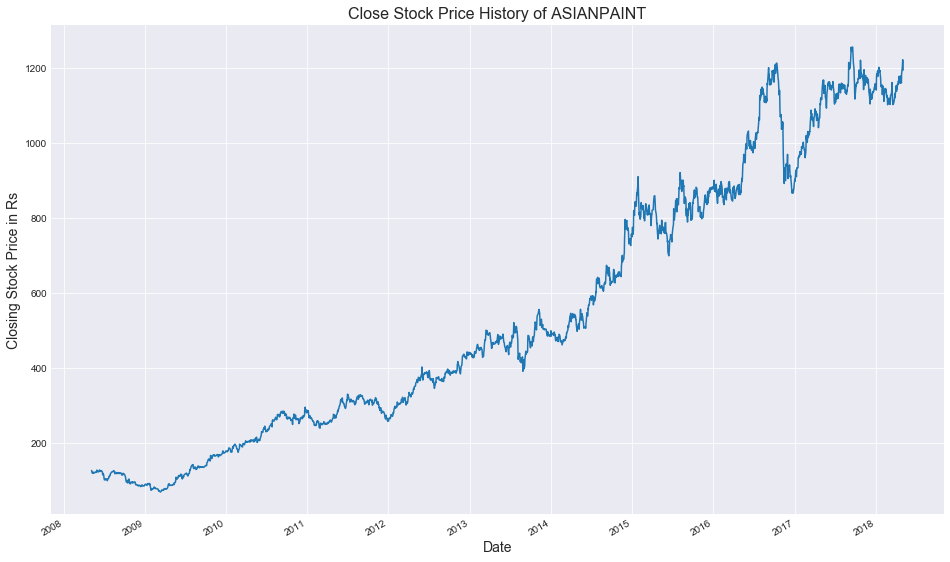

In [38]:
# Import matplotlib package for date plots
import matplotlib.dates as mdates

years = mdates.YearLocator() # Get every year
yearsFmt = mdates.DateFormatter('%Y') # Set year format

# Create subplots to plot graph and control axes
fig, ax = plt.subplots()
ax.plot(final_data['Date'], final_data['Close'])

# Format the ticks
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)

# Set figure title
plt.title('Close Stock Price History of ASIANPAINT', fontsize=16)
# Set x label
plt.xlabel('Date', fontsize=14)
# Set y label
plt.ylabel('Closing Stock Price in Rs', fontsize=14)

# Rotate and align the x labels
fig.autofmt_xdate()

# Show plot
plt.show()

# Function for visualizing any Company stocks

In [49]:
def plot_close_price(data,symbol_name):
    
    df = data[data['Symbol']==symbol_name]
    final_data = pd.DataFrame(df, columns=['Date', 'Close'])
    final_data.dropna(inplace=True)
    
    years = mdates.YearLocator() # Get every year
    yearsFmt = mdates.DateFormatter('%Y') # Set year format
    
    # Create subplots to plot graph and control axes
    fig, ax = plt.subplots()
    ax.plot(final_data['Date'], final_data['Close'])

    # Format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)

    # Set figure title
    plt.title('Close Stock Price History of {}'.format(symbol_name), fontsize=16)
    # Set x label
    plt.xlabel('Date', fontsize=14)
    # Set y label
    plt.ylabel('Closing Stock Price in Rs', fontsize=14)

    # Rotate and align the x labels
    fig.autofmt_xdate()

    # Show plot
    plt.show()

In [18]:
data['Symbol'].unique()

array(['ADANIPORTS', 'ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BHARTIARTL',
       'COALINDIA', 'DRREDDY', 'HDFC', 'HDFCBANK', 'HEROMOTOCO',
       'HINDUNILVR', 'ICICIBANK', 'INDUSINDBK', 'INFY', 'ITC',
       'KOTAKBANK', 'LT', 'M&M', 'MARUTI', 'ONGC', 'RELIANCE', 'SBIN',
       'SUNPHARMA', 'TATAMOTORS', 'TATAMTRDVR', 'TATASTEEL', 'TCS',
       'WIPRO', 'YESBANK', 'POWERGRID'], dtype=object)

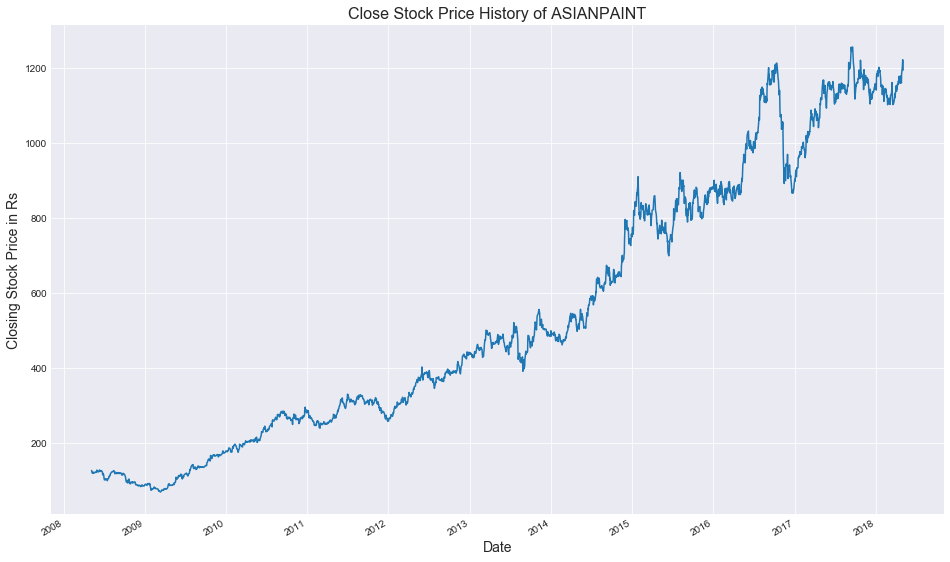

In [50]:
plot_close_price(data,'ASIANPAINT')

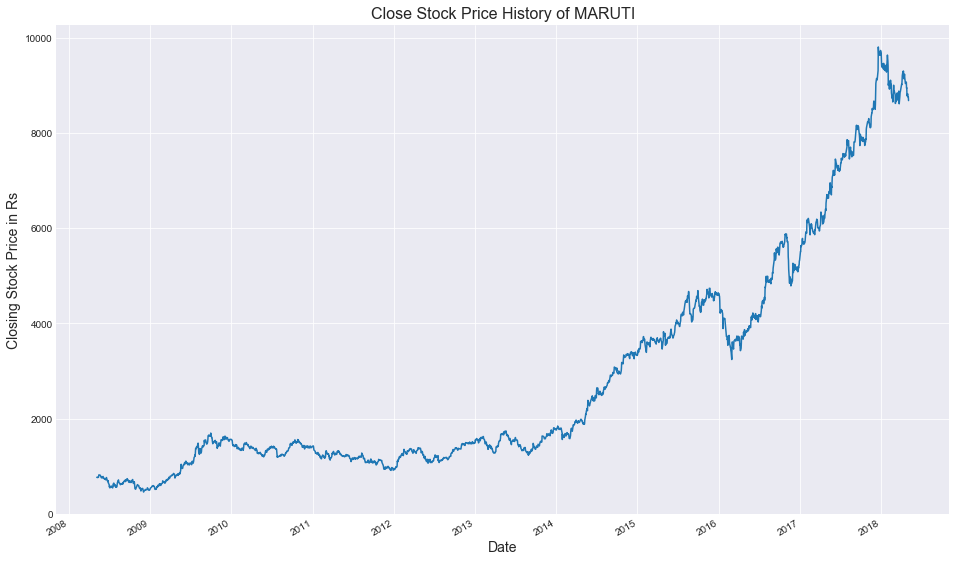

In [51]:
plot_close_price(data,'MARUTI')

# Prediction for ASIANPAINT

In [21]:
final_data

,Date,Close
2469,2008-05-06,127.730003
2470,2008-05-07,127.004997
2471,2008-05-08,123.000000
2472,2008-05-09,121.199997
2473,2008-05-12,120.000000
...,...,...
4933,2018-04-27,1184.449951
4934,2018-04-30,1200.150024
4935,2018-05-02,1221.750000
4936,2018-05-03,1206.500000


# Linear Regression
**Our data contains only one independent variable ($X$)</strong> which represents the <em>date</em> and the <strong>dependent variable ($Y$)</strong> we are trying to predict is the <em>Stock Price</em>. To fit a line to the data points, which then represents an estimated relationship between $X$ and $Y$, we can use a Simple Linear Regression.

The best fit line can be described with
$$
Y = \beta_0 + \beta_1 X
$$

where

* $Y$ is the predicted value of the dependent variable
* $\beta_0$ is the y-intercept
* $\beta_1$ is the slope
* $X$ is the value of the independent variable

The goal is to find such coefficients $\beta_0$ and $\beta_1$ that the Sum of Squared Errors, which represents the difference between each point in the dataset with it’s corresponding predicted value outputted by the model, is minimal.

## Training a Linear Regression Model

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
train, test = train_test_split(final_data, test_size=0.20)

In [24]:
from sklearn.linear_model import LinearRegression

In [25]:
train.shape

(1969, 2)

In [26]:
test.shape

(493, 2)

In [27]:
X_train = np.array(train.index).reshape(-1, 1)
y_train = train['Close']

In [28]:
model = LinearRegression()

model.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

## Model Evaluation

In [29]:
print('Slope: ', np.asscalar(np.squeeze(model.coef_)))

print('Intercept: ', model.intercept_)

Slope:  0.48124417808304165
Intercept:  -1237.6431692271665


C:\Users\Anurag\anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead



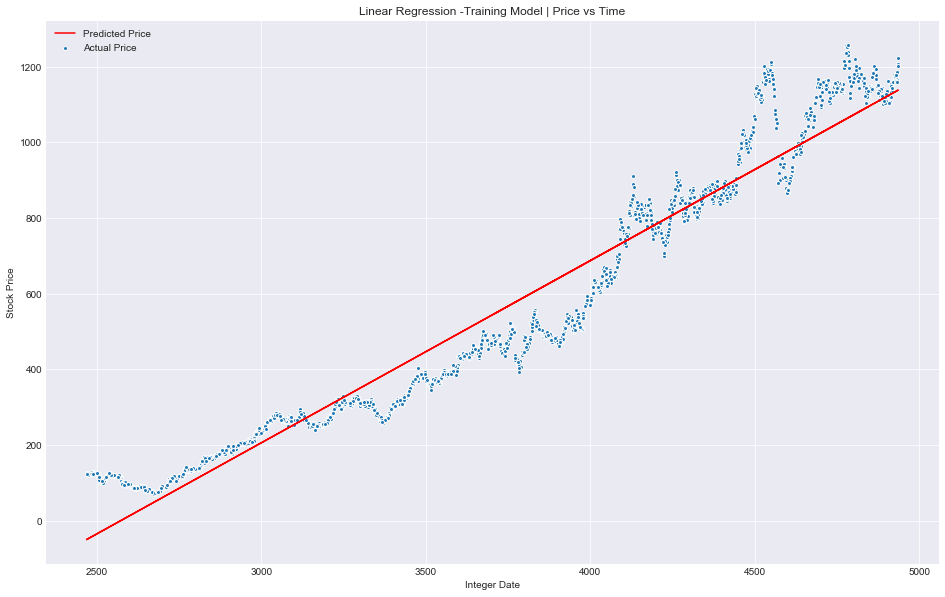

In [30]:
plt.figure(1, figsize=(16,10))
plt.title('Linear Regression -Training Model | Price vs Time')
plt.scatter(X_train, y_train, edgecolors='w', label='Actual Price')
plt.plot(X_train, model.predict(X_train), color='r', label='Predicted Price')
plt.xlabel('Integer Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

## Prediction from our Model

In [31]:
X_test = np.array(test.index).reshape(-1, 1)
y_test = test['Close']

In [32]:
y_pred = model.predict(X_test)

## Plotting

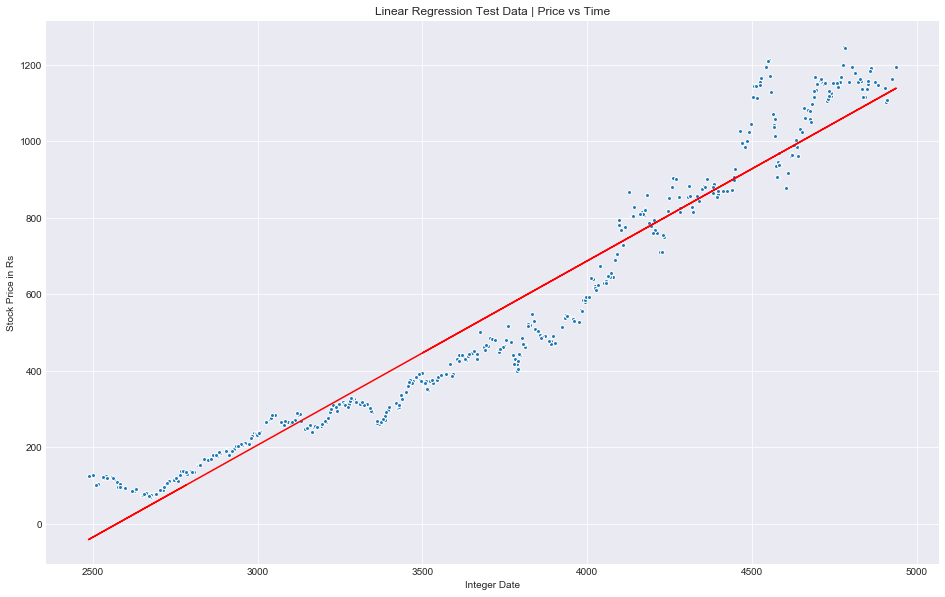

In [33]:
# Plot fitted line, y test
plt.figure(1, figsize=(16,10))
plt.title('Linear Regression Test Data | Price vs Time')
plt.plot(X_test, y_pred, color='r', label='Predicted Price')
plt.scatter(X_test, y_test, edgecolor='w', label='Actual Price')

plt.xlabel('Integer Date')
plt.ylabel('Stock Price in Rs')

plt.show()

# Plot predicted vs actual prices

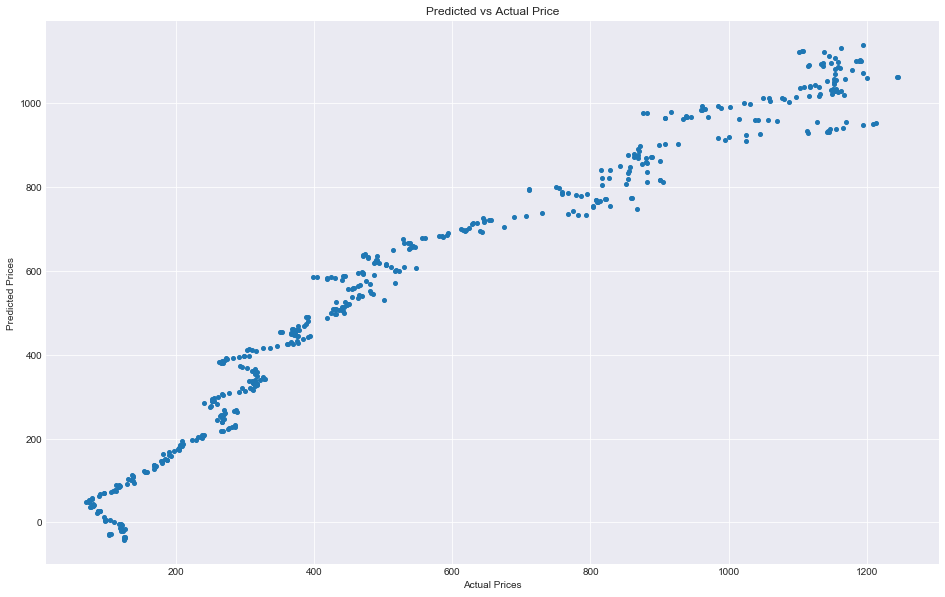

In [34]:
plt.scatter(y_test, y_pred)

plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')

plt.title('Predicted vs Actual Price')

plt.show()

# Import norm package to plot normal distribution

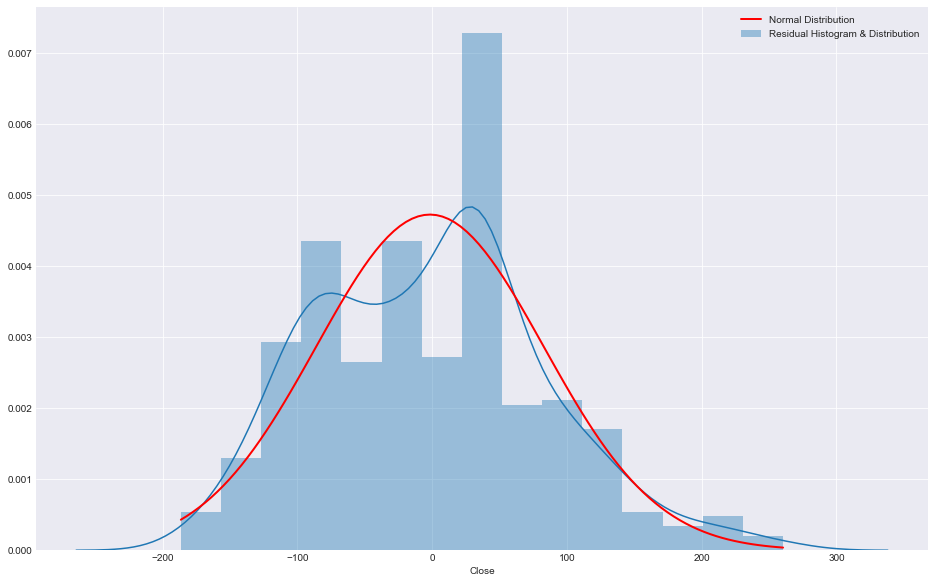

In [35]:
from scipy.stats import norm

# Fit a normal distribution to the data:
mu, std = norm.fit(y_test - y_pred)

ax = sns.distplot((y_test - y_pred), label='Residual Histogram & Distribution')

# Calculate the pdf over a range of values         
x = np.linspace(min(y_test - y_pred), max(y_test - y_pred), 100)
p = norm.pdf(x, mu, std)

# And plot on the same axes that seaborn put the histogram
ax.plot(x, p, 'r', lw=2, label='Normal Distribution') 

plt.legend()
plt.show()

In [42]:
# Add new column for predictions to df
final_data['Prediction'] = model.predict(np.array(final_data.index).reshape(-1, 1))

In [44]:
final_data.tail()

,Date,Close,Prediction
4933,2018-04-27,1184.449951,1136.334361
4934,2018-04-30,1200.150024,1136.815605
4935,2018-05-02,1221.750000,1137.296850
4936,2018-05-03,1206.500000,1137.778094
4937,2018-05-04,1194.250000,1138.259338


# Error Evaluation Metrics
**Mean Absolute Error (MAE)** is the mean of the absolute value of the errors:$$
\frac{1}{N} \sum_{i = 1}^{N} |y_i - \hat{y}_i|
$$

**Mean Squared Error (MSE)** is the mean of the squared errors:$$
\frac{1}{N} \sum_{i = 1}^{N} (y_i - \hat{y}_i)^2
$$

**Root Mean Squared Error (RMSE)** is the square root of the mean of the squared errors:$$
\sqrt{\frac{1}{N} \sum_{i = 1}^{N} (y_i - \hat{y}_i)^2}
$$

All of these are **cost functions** we want to minimize.

In [36]:
from sklearn import metrics

In [45]:
df['Close'].describe()

count    2462.000000
mean      544.272408
std       354.446928
min        70.199997
25%       260.313744
50%       455.764999
75%       856.475006
max      1255.849976
Name: Close, dtype: float64

In [37]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 69.01186617191169
Mean Squared Error: 7134.30382008905
Root Mean Squared Error: 84.46480817529304


## Accuracy Evaluation Metrics
To see how accurate our model is, we can calculate the **Coefficient of determination**, which describes the ratio between the total error and the error, that is explained by our model. It's value is between 0 and 1, with 1 meaning 100% of the error is acoounted for by the model.

**Coefficient of determination**$$
R^2 = 1 - \frac{RSS}{TSS}
$$

with

**Residual Sum of Squares (RSS)**$$
RSS = \sum_{i = 1}^{N} \epsilon_i^2 = \sum_{i = 1}^{N} (y_i - \hat{y}_i)^2
$$

**Total Sum of Squares (TSS)**$$
TSS = \sum_{i = 1}^{N} (y_i - \bar{y}_i)^2
$$

In [39]:
print('R2: ', metrics.r2_score(y_test, y_pred))

R2:  0.9433809651393651


In [40]:
from sklearn.metrics import explained_variance_score
explained_variance_score(y_test, y_pred)

0.9434027255188944

**The value of $R^2$ shows that are model accounts for nearly 94% of the differences between the actual stock prices and the predicted prices.**

# Function for Predicting Stock Prices of  all Companies

In [54]:
def predicting_stock_prices(data,symbol_name):
    df = data[data['Symbol']==symbol_name]
    final_data = pd.DataFrame(df, columns=['Date', 'Close'])
    final_data.dropna(inplace=True)
    
    train, test = train_test_split(final_data, test_size=0.20)
    X_train = np.array(train.index).reshape(-1, 1)
    y_train = train['Close']
    model = LinearRegression()
    model.fit(X_train,y_train)
    
    print('Slope: ', np.asscalar(np.squeeze(model.coef_)))
    print('Intercept: ', model.intercept_)
    
    plt.figure(1, figsize=(16,10))
    plt.title('Linear Regression -Training Model | Price vs Time {}'.format(symbol_name))
    plt.scatter(X_train, y_train, edgecolors='w', label='Actual Price')
    plt.plot(X_train, model.predict(X_train), color='r', label='Predicted Price')
    plt.xlabel('Integer Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()
    
    X_test = np.array(test.index).reshape(-1, 1)
    y_test = test['Close']
    y_pred = model.predict(X_test)
    
    plt.figure(1, figsize=(16,10))
    plt.title('Linear Regression Test Data | Price vs Time of {}'.format(symbol_name))
    plt.plot(X_test, y_pred, color='r', label='Predicted Price')
    plt.scatter(X_test, y_test, edgecolor='w', label='Actual Price')
    plt.xlabel('Integer Date')
    plt.ylabel('Stock Price in Rs')
    plt.show()
    
    plt.scatter(y_test, y_pred)
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    plt.title('Predicted vs Actual Price')
    plt.show()
    
    # Calculate and print values of MAE, MSE, RMSE
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
    print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    
    print('R2: ', metrics.r2_score(y_test, y_pred))

In [57]:
data['Symbol'].unique()

array(['ADANIPORTS', 'ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BHARTIARTL',
       'COALINDIA', 'DRREDDY', 'HDFC', 'HDFCBANK', 'HEROMOTOCO',
       'HINDUNILVR', 'ICICIBANK', 'INDUSINDBK', 'INFY', 'ITC',
       'KOTAKBANK', 'LT', 'M&M', 'MARUTI', 'ONGC', 'RELIANCE', 'SBIN',
       'SUNPHARMA', 'TATAMOTORS', 'TATAMTRDVR', 'TATASTEEL', 'TCS',
       'WIPRO', 'YESBANK', 'POWERGRID'], dtype=object)

# MARUTI Stock Prices

C:\Users\Anurag\anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning:

np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead



Slope:  2.8551116043668743
Intercept:  -125806.13347622279


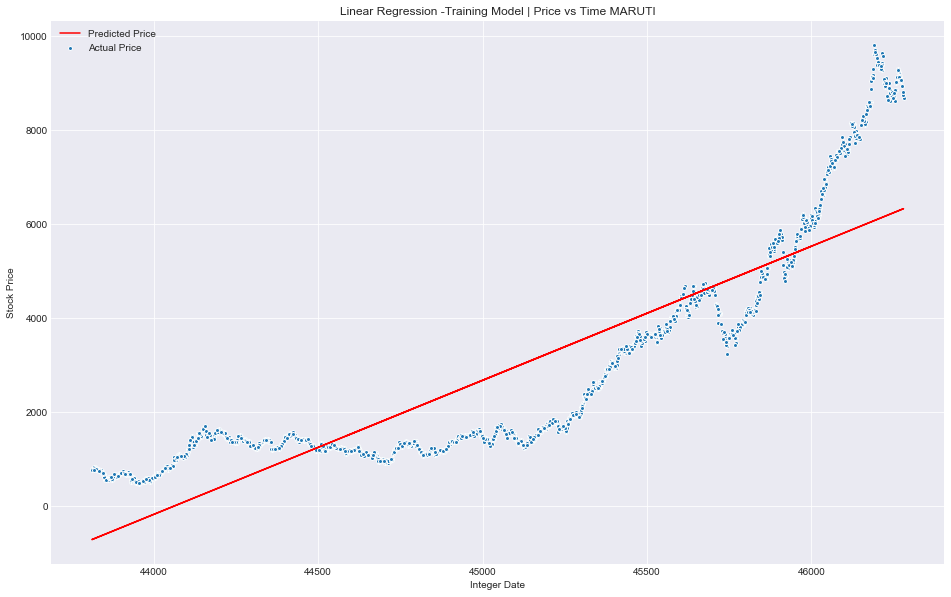

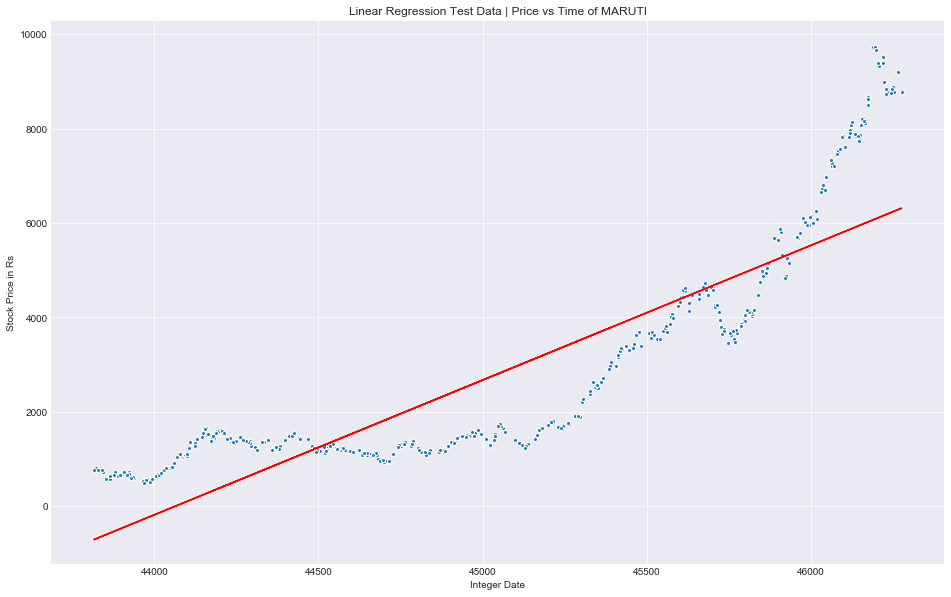

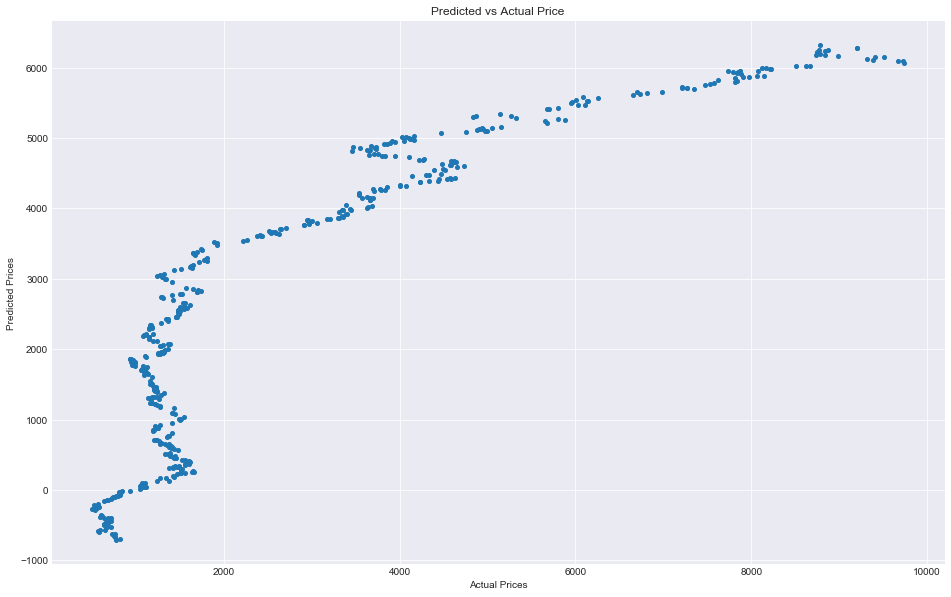

Mean Absolute Error: 968.1827361961787
Mean Squared Error: 1346526.8246314356
Root Mean Squared Error: 1160.3994246083698
R2:  0.7554318110752765


In [56]:
predicting_stock_prices(data,'MARUTI')

# AXISBANK Stock Prices

C:\Users\Anurag\anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning:

np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead



Slope:  0.1875100543728264
Intercept:  -829.9352979267086


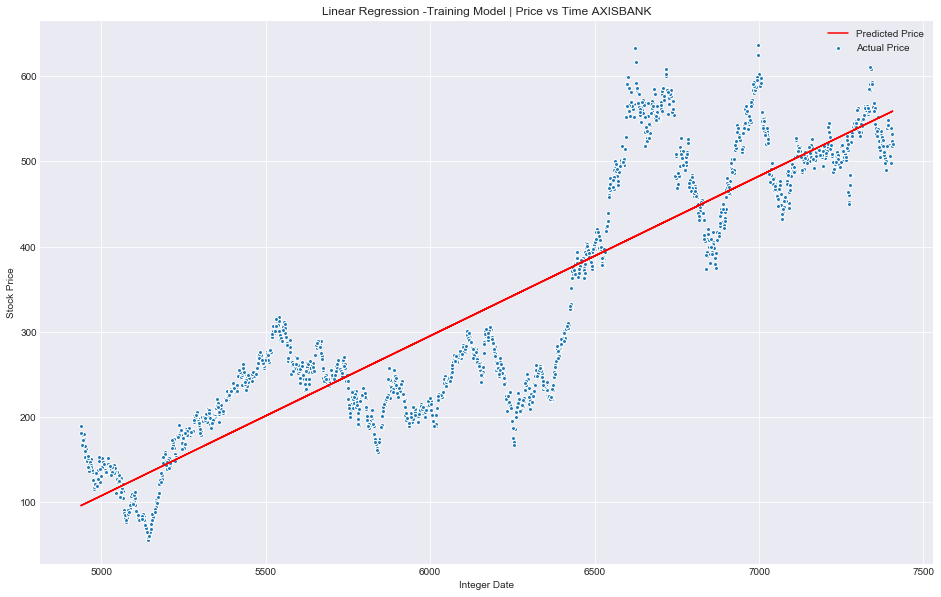

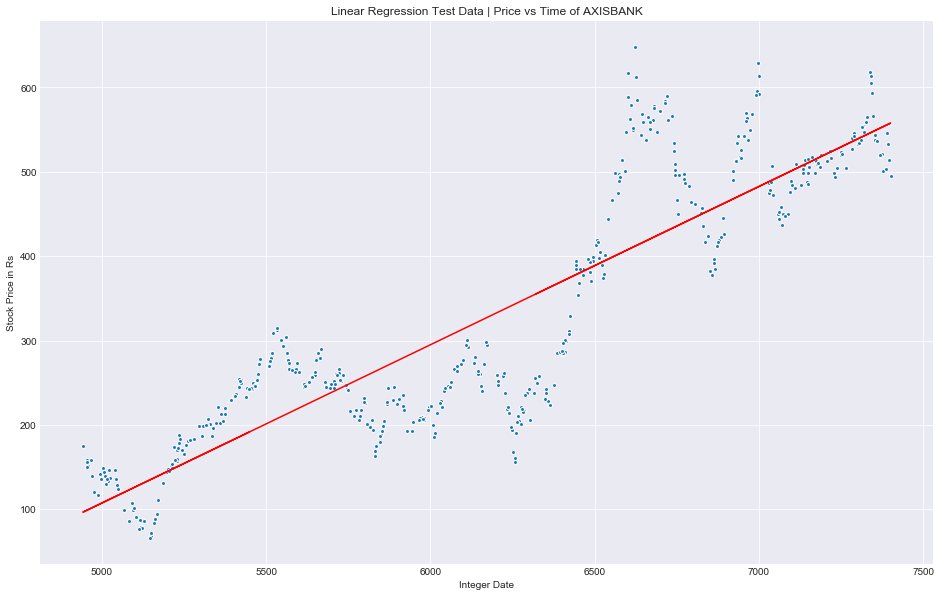

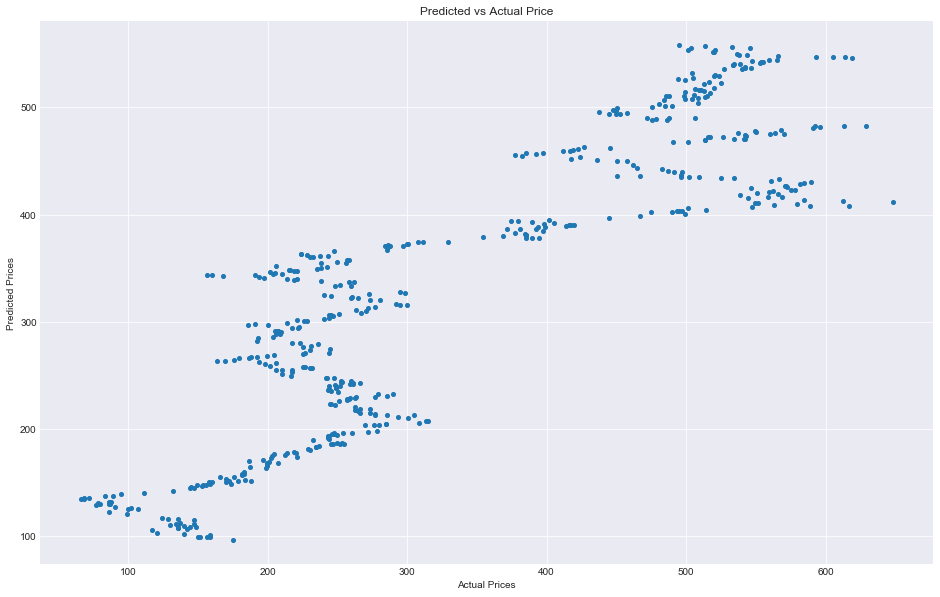

Mean Absolute Error: 55.25001777841049
Mean Squared Error: 4947.1928523445
Root Mean Squared Error: 70.33628403849964
R2:  0.7857154824569146


In [58]:
predicting_stock_prices(data,'AXISBANK')

# HDFCBANK Stock Prices

C:\Users\Anurag\anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning:

np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead



Slope:  0.6243684363402292
Intercept:  -11927.929267845651


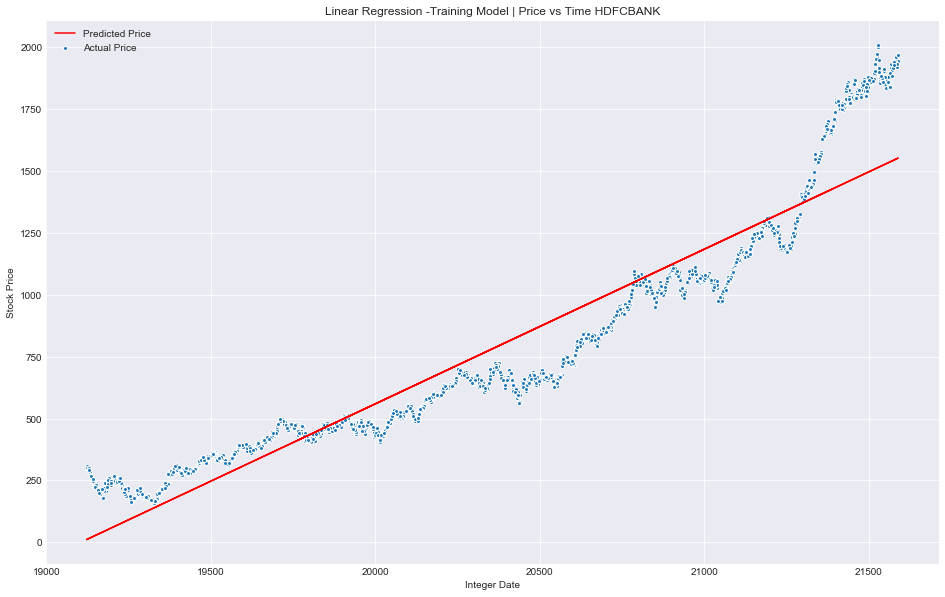

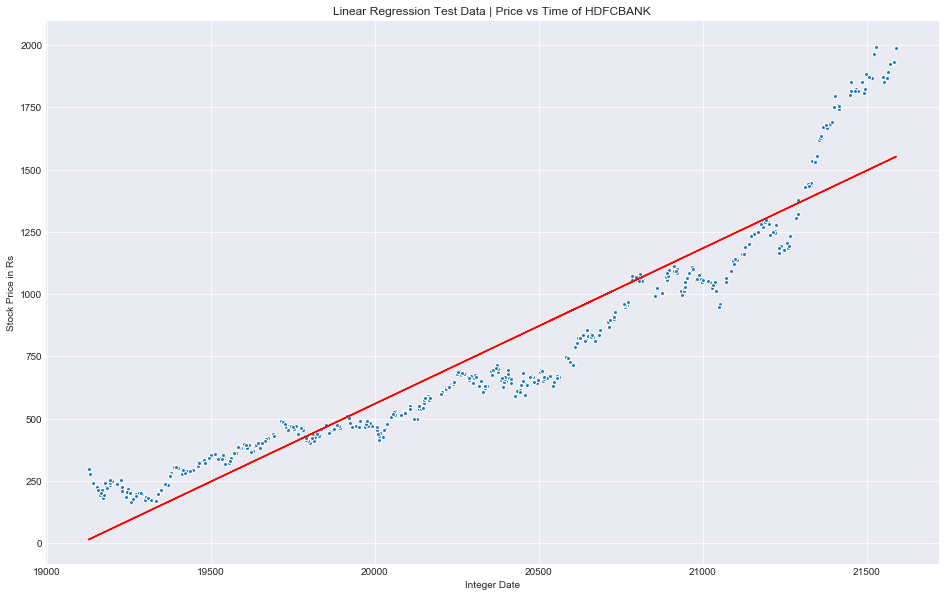

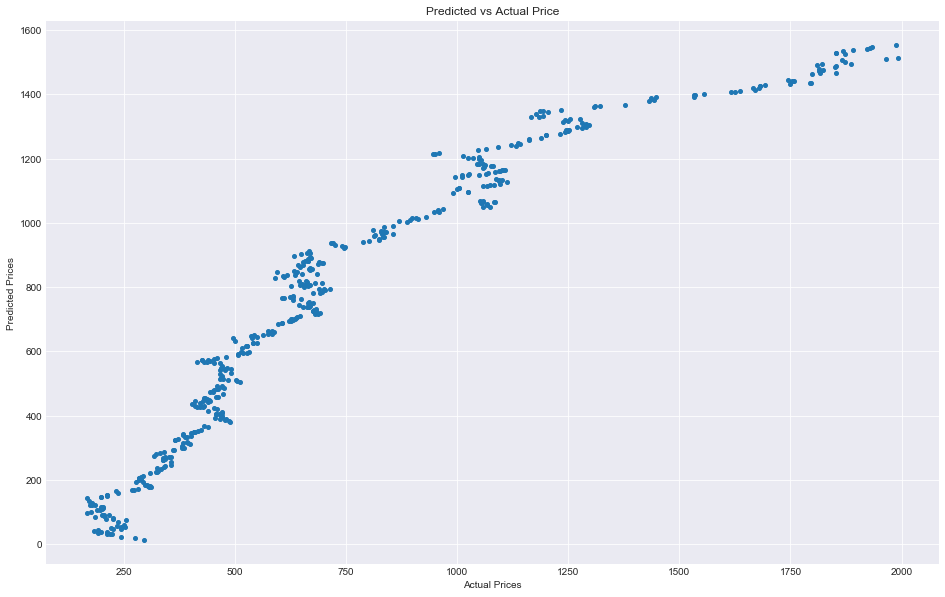

Mean Absolute Error: 117.19408761193434
Mean Squared Error: 21331.52075576874
Root Mean Squared Error: 146.0531436011178
R2:  0.8932095106676066


In [59]:
predicting_stock_prices(data,'HDFCBANK')

# YESBANK Stock Prices

C:\Users\Anurag\anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning:

np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead



Slope:  0.12001740988706505
Intercept:  -8233.567478664167


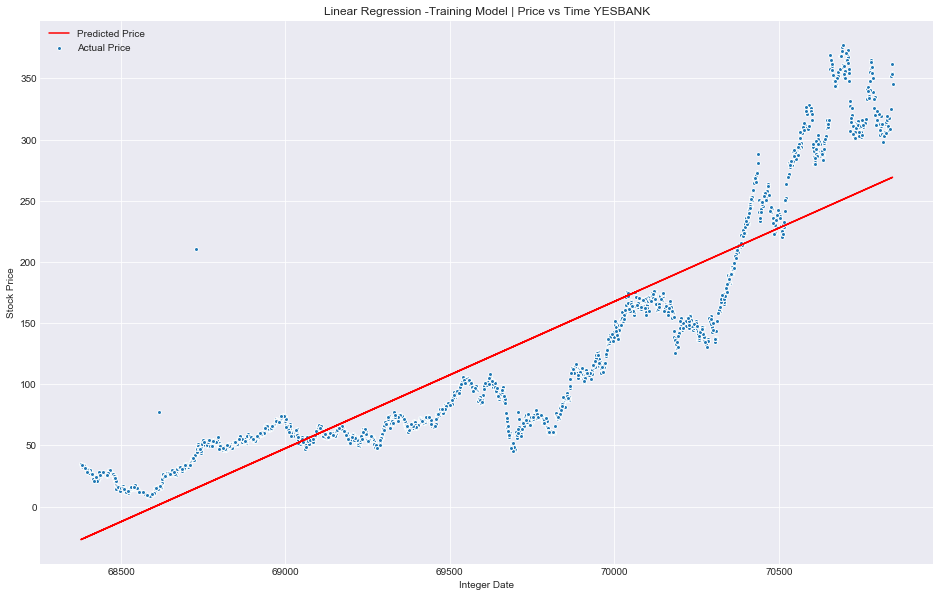

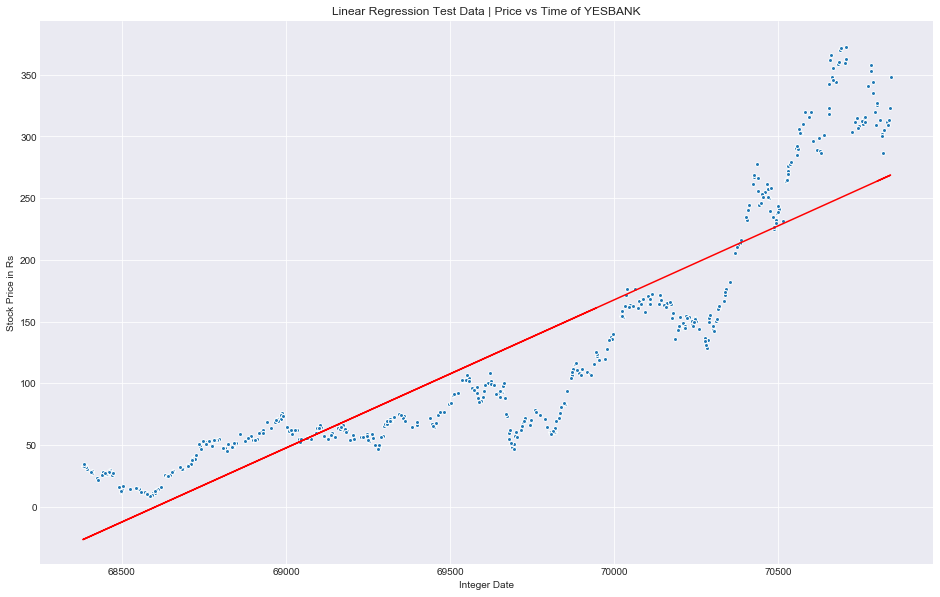

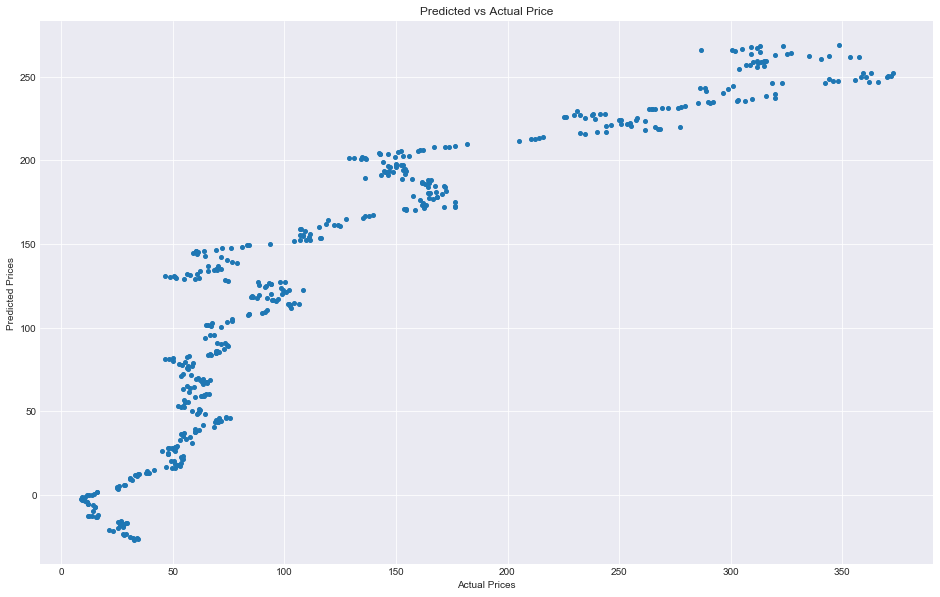

Mean Absolute Error: 35.98839183550472
Mean Squared Error: 1913.350855901716
Root Mean Squared Error: 43.74186616848572
R2:  0.8047366277327068


In [60]:
predicting_stock_prices(data,'YESBANK')

# The End!